# Exploration of Yelp BUSINESS category data

In another notebook we assigned businesses to one of the ten metro areas and screened out businesses that didn't seem to belong to any of those metros.  This now sits in a nice JSON file bus_metro2.json.

Before we get deep into looking at geographical mapping of underserved areas, we need to figure out some promising categories of business to concentrate on.

Questions to inform that are:

1) What categories of business exist?

2) Are categories generally hierarchical, e.g. are all Pizza places also Restaurants?

3) For businesses that are in multiple categories, what are common groupings of categories?

4) How do the number of businesses in each category vary by city?

5) What are typical spreads of review score for businesses within a category?

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import json
import numpy as np
import pandas as pd

In [3]:
with open("bus_metro2.json", "rt") as infile:
    dfb = pd.read_json(infile)

In [4]:
dfb

,attributes,categories,city,full_address,hours,latitude,longitude,metro,name,neighborhoods,open,review_count,stars,state,type
--0ZoBTQWQra1FxD4rBWmg,{'Accepts Credit Cards': False},"[Property Management, Home Services, Real Estate]",Phoenix,"2920 E Camelback Rd\nSte100\nPhoenix, AZ 85016","{'Wednesday': {'open': '09:00', 'close': '17:0...",33.510773,-112.018737,Phoenix,Bourquin Residential Group,[],True,4,2.0,AZ,business
--1emggGHgoG6ipd_RMb-g,"{'Take-out': False, 'Accepts Credit Cards': Tr...","[Food, Convenience Stores]",Las Vegas,"3280 S Decatur Blvd\nWestside\nLas Vegas, NV 8...",{},36.130531,-115.207238,Las Vegas,Sinclair,[Westside],True,4,4.0,NV,business
--4Pe8BZ6gj57VFL5mUE8g,"{'Accepts Credit Cards': True, 'Parking': {'lo...","[Shopping, Office Equipment]",Phoenix,"21001 North Tatum Blvd. #24\nPhoenix, AZ 85050",{},33.676354,-111.973651,Phoenix,Office Max,[],True,9,3.0,AZ,business
--5jkZ3-nUPZxUvtcbr8Uw,"{'Delivery': False, 'Has TV': False, 'Caters':...","[Greek, Vegetarian, Mediterranean, Restaurants]",Scottsdale,"1336 N Scottsdale Rd\nScottsdale, AZ 85257","{'Wednesday': {'open': '11:00', 'close': '21:0...",33.463373,-111.926908,Phoenix,Mika's Greek,[],True,127,4.5,AZ,business
--7PRjnsjMA6uhPK8mW13Q,{},"[Bars, Nightlife]",Pittsburgh,"3160 Library Rd\nPittsburgh, PA 15234",{},40.371878,-80.008930,Pittsburgh,Castle Tavern,[],True,3,2.5,PA,business
--AKjxBmhm9DWrh-e0hTOw,"{'Delivery': False, 'Take-out': False, 'Takes ...","[Restaurants, Italian]",Laval,"993 Boulevard Saint-Martin Ouest\nLaval, QC H7...","{'Wednesday': {'open': '11:00', 'close': '22:0...",45.572509,-73.720293,Montreal,Grigio,[],True,6,4.5,QC,business
--BlvDO_RG2yElKu9XA1_g,"{'Delivery': True, 'Has TV': False, 'Caters': ...","[Sushi Bars, Hawaiian, Chinese, Restaurants]",Scottsdale,"14870 N Northsight Blvd\nSte 103\nScottsdale, ...","{'Wednesday': {'open': '10:30', 'close': '21:0...",33.621605,-111.899066,Phoenix,Asian Island,[],True,122,4.0,AZ,business
--Dl2rW_xO8GuYBomlg9zw,{'By Appointment Only': True},"[Medical Centers, Health & Medical]",Las Vegas,"4505 S Maryland Pkwy\nUniversity\nLas Vegas, N...",{},36.110940,-115.141514,Las Vegas,UNLV Student Health Center,[University],True,7,4.5,NV,business
--LzU4UT9rysIDXbhoWHiQ,"{'Accepts Credit Cards': True, 'Parking': {'lo...","[Hair Salons, Day Spas, Nail Salons, Beauty & ...",Pittsburgh,"99 S 10th St\nSouth Side\nPittsburgh, PA 15203","{'Wednesday': {'open': '11:00', 'close': '20:0...",40.427499,-79.988313,Pittsburgh,Lunasea Salon+Day Spa,[South Side],True,10,4.5,PA,business
--NCcmQqh_NZbjW1S5XsGQ,"{'Parking': {'lot': False, 'validated': False,...","[Bakeries, Food, Desserts]",Montréal,"291 Beaudoin Street\nSud-Ouest\nMontréal, QC H...","{'Wednesday': {'open': '08:00', 'close': '18:0...",45.474274,-73.585614,Montreal,Sweet Lee's Rustic Bakery,[Sud-Ouest],False,5,4.5,QC,business


The categories data is set up so that a business can be in multiple categories.  Let's start by just getting a simple list to see what categories exist and how often each category occurs.

In [5]:
uniq_cats = dict()
cat_counts = list()
for cat_list in dfb.categories:
    cat_counts.append(len(cat_list))
    for item in cat_list:
        uniq_cats[item] = uniq_cats.get(item, 0) + 1
uc = pd.Series(uniq_cats)
uc.sort_values(ascending = False)

Restaurants                  26727
Shopping                     12444
Food                         10143
Beauty & Spas                 7490
Health & Medical              6106
Home Services                 5865
Nightlife                     5507
Automotive                    4887
Bars                          4727
Local Services                4040
Active Life                   3455
Fashion                       3395
Event Planning & Services     3236
Fast Food                     3153
Pizza                         2881
Mexican                       2705
Hotels & Travel               2673
Sandwiches                    2665
American (Traditional)        2608
Arts & Entertainment          2447
Hair Salons                   2436
Coffee & Tea                  2399
Doctors                       2061
Burgers                       1960
Italian                       1939
Auto Repair                   1907
Home & Garden                 1904
Nail Salons                   1889
Chinese             

In [6]:
uc.describe()

count     1017.000000
mean       251.400197
std       1140.576004
min          1.000000
25%          7.000000
50%         30.000000
75%        127.000000
max      26727.000000
dtype: float64

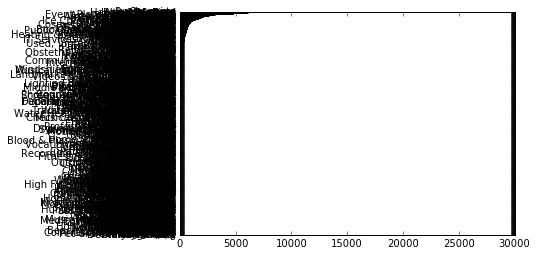

In [7]:
uc.sort_values().plot(kind = "barh")

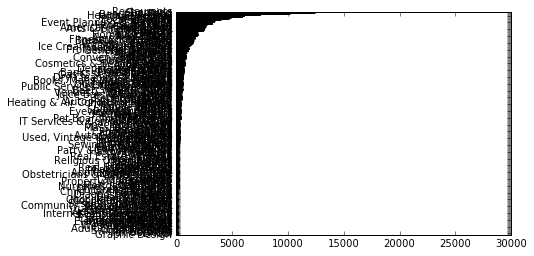

In [8]:
uc[uc > 125].sort_values().plot(kind = "barh")

Now take a look at how often different counts of categories occur

In [9]:
cc = pd.Series(cat_counts)
cc.value_counts()

2     38098
3     22058
4     14023
5      7290
6      2679
1       987
7       445
0       241
8        64
9         6
10        2
dtype: int64

Notice that some items have zero for their categories i.e. empty category lists

In [10]:
dfb.categories.sort_values()

wWxP2WU6nE51tU4qCIbFAw                                                   []
myB3gXn2v1zJ3CJidKonlA                                                   []
80wCTsbp7P31z6uE-MygIA                                                   []
79jPb6BkkR9qkLvLcaKtgA                                                   []
5dvn4l9U4PxeMBAH3o3gow                                                   []
-M_weiPnSYoSph65DJMrkQ                                                   []
7Ag5d5YMH_IEsEzderfYug                                                   []
a3pcSAseslnJxYK5fZdY-g                                                   []
rPAHCJZeyBWEdTcemUu4vQ                                                   []
B19IQK_j2cwrcA7BdAMGtQ                                                   []
3m1NBKaI89b0nCmr_TYmAA                                                   []
uqMqt00AMql3UQtsV_stcA                                                   []
8uXh-z1kwOpZuvG2TaWOqg                                                   []
NT-ZAGb05qYf

Add a 'numcats' column which shows how many categories are in the list, as it seems pandas doesn't really like data elements that are themselves lists, so a lot of the methods dont work well on them.

In [11]:
dfb["numcats"] = dfb.categories.map(len)
dfb

,attributes,categories,city,full_address,hours,latitude,longitude,metro,name,neighborhoods,open,review_count,stars,state,type,numcats
--0ZoBTQWQra1FxD4rBWmg,{'Accepts Credit Cards': False},"[Property Management, Home Services, Real Estate]",Phoenix,"2920 E Camelback Rd\nSte100\nPhoenix, AZ 85016","{'Wednesday': {'open': '09:00', 'close': '17:0...",33.510773,-112.018737,Phoenix,Bourquin Residential Group,[],True,4,2.0,AZ,business,3
--1emggGHgoG6ipd_RMb-g,"{'Take-out': False, 'Accepts Credit Cards': Tr...","[Food, Convenience Stores]",Las Vegas,"3280 S Decatur Blvd\nWestside\nLas Vegas, NV 8...",{},36.130531,-115.207238,Las Vegas,Sinclair,[Westside],True,4,4.0,NV,business,2
--4Pe8BZ6gj57VFL5mUE8g,"{'Accepts Credit Cards': True, 'Parking': {'lo...","[Shopping, Office Equipment]",Phoenix,"21001 North Tatum Blvd. #24\nPhoenix, AZ 85050",{},33.676354,-111.973651,Phoenix,Office Max,[],True,9,3.0,AZ,business,2
--5jkZ3-nUPZxUvtcbr8Uw,"{'Delivery': False, 'Has TV': False, 'Caters':...","[Greek, Vegetarian, Mediterranean, Restaurants]",Scottsdale,"1336 N Scottsdale Rd\nScottsdale, AZ 85257","{'Wednesday': {'open': '11:00', 'close': '21:0...",33.463373,-111.926908,Phoenix,Mika's Greek,[],True,127,4.5,AZ,business,4
--7PRjnsjMA6uhPK8mW13Q,{},"[Bars, Nightlife]",Pittsburgh,"3160 Library Rd\nPittsburgh, PA 15234",{},40.371878,-80.008930,Pittsburgh,Castle Tavern,[],True,3,2.5,PA,business,2
--AKjxBmhm9DWrh-e0hTOw,"{'Delivery': False, 'Take-out': False, 'Takes ...","[Restaurants, Italian]",Laval,"993 Boulevard Saint-Martin Ouest\nLaval, QC H7...","{'Wednesday': {'open': '11:00', 'close': '22:0...",45.572509,-73.720293,Montreal,Grigio,[],True,6,4.5,QC,business,2
--BlvDO_RG2yElKu9XA1_g,"{'Delivery': True, 'Has TV': False, 'Caters': ...","[Sushi Bars, Hawaiian, Chinese, Restaurants]",Scottsdale,"14870 N Northsight Blvd\nSte 103\nScottsdale, ...","{'Wednesday': {'open': '10:30', 'close': '21:0...",33.621605,-111.899066,Phoenix,Asian Island,[],True,122,4.0,AZ,business,4
--Dl2rW_xO8GuYBomlg9zw,{'By Appointment Only': True},"[Medical Centers, Health & Medical]",Las Vegas,"4505 S Maryland Pkwy\nUniversity\nLas Vegas, N...",{},36.110940,-115.141514,Las Vegas,UNLV Student Health Center,[University],True,7,4.5,NV,business,2
--LzU4UT9rysIDXbhoWHiQ,"{'Accepts Credit Cards': True, 'Parking': {'lo...","[Hair Salons, Day Spas, Nail Salons, Beauty & ...",Pittsburgh,"99 S 10th St\nSouth Side\nPittsburgh, PA 15203","{'Wednesday': {'open': '11:00', 'close': '20:0...",40.427499,-79.988313,Pittsburgh,Lunasea Salon+Day Spa,[South Side],True,10,4.5,PA,business,4
--NCcmQqh_NZbjW1S5XsGQ,"{'Parking': {'lot': False, 'validated': False,...","[Bakeries, Food, Desserts]",Montréal,"291 Beaudoin Street\nSud-Ouest\nMontréal, QC H...","{'Wednesday': {'open': '08:00', 'close': '18:0...",45.474274,-73.585614,Montreal,Sweet Lee's Rustic Bakery,[Sud-Ouest],False,5,4.5,QC,business,3


Let's take a look at the businesses with no categories assigned.  We might choose to suppress these later as well.

In [12]:
dfb[dfb["numcats"] == 0]

,attributes,categories,city,full_address,hours,latitude,longitude,metro,name,neighborhoods,open,review_count,stars,state,type,numcats
-EP91N826V1U_tXVDGb__w,{},[],Las Vegas,"5837 Lenapee Ct\nSpring Valley\nLas Vegas, NV ...","{'Wednesday': {'open': '09:00', 'close': '17:0...",36.082566,-115.273590,Las Vegas,Avalon Appliance Repair Inc,[Spring Valley],True,18,1.5,NV,business,0
-M_weiPnSYoSph65DJMrkQ,{},[],Montréal,"1500 Atwater Av\nVille-Marie\nMontréal, QC H3Z...",{},45.488988,-73.585914,Montreal,Sukiyaki,[Ville-Marie],True,3,1.5,QC,business,0
-OnsiJtURCP4Pvo3MavuMg,{},[],Apache Junction,"950 E Baseline Avenue\nApache Junction, AZ 85219",{},33.379873,-111.536143,Phoenix,All E Rc,[],True,3,2.5,AZ,business,0
-Z6JGtrYUyeUY-goCEV3lQ,{},[],Phoenix,"21410 N 19th Avenue\nPhoenix, AZ 85027",{},33.681081,-112.100611,Phoenix,Global Water Resources,[],True,6,1.5,AZ,business,0
-aSlChGXUPUix9DJZISgmA,{},[],Las Vegas,"1100 S Rainbow Boulevard\nWestside\nLas Vegas,...",{},36.158696,-115.243309,Las Vegas,Rebel Oil Company,[Westside],True,3,3.0,NV,business,0
-cy5wpSxGtSIw2biS-U_Pw,{},[],Mesa,"3544 E Southern Ave\nSte 102\nMesa, AZ 85204",{},33.395160,-111.754382,Phoenix,Water N Ice,[],True,4,2.0,AZ,business,0
-iVv7rP4YDYOY_itnH5NYA,{},[],Phoenix,"3324 W Van Buren St\nPhoenix, AZ 85009",{},33.451390,-112.131263,Phoenix,Victoria Bridal Boutique,[],True,3,1.0,AZ,business,0
-xXW9LX1p2QN-S19ivqebA,{},[],Phoenix,"7250 N 16th St Ste 105\nPhoenix, AZ 85020",{},33.543352,-112.047909,Phoenix,A L Financial,[],True,7,1.0,AZ,business,0
0HPpvRkeICcim5CaRLy1zA,{},[],Scottsdale,"Scottsdale, AZ 85250",{},33.524364,-111.898592,Phoenix,Tatem Air Conditioning & Heating,[],False,4,1.0,AZ,business,0
0a0vpHfkjYpDbjqPctQWEw,{},[],Charlotte,"1614 South Blvd\nSouth End\nCharlotte, NC 28203",{},35.213578,-80.856300,Charlotte,Concentra,"[South End, Dilworth]",True,16,3.0,NC,business,0


Now look at the ones with just one category

In [13]:
dfb[dfb["numcats"] == 1]

,attributes,categories,city,full_address,hours,latitude,longitude,metro,name,neighborhoods,open,review_count,stars,state,type,numcats
-0QBrNvhrPQCaeo7mTo0zQ,"{'Delivery': False, 'Take-out': True, 'Takes R...",[Restaurants],Phoenix,"2526 W Van Buren St\nPhoenix, AZ 85009",{},33.451391,-112.114419,Phoenix,La Salcita,[],True,4,3.5,AZ,business,1
-0zqgYIic5BUprV1xAabDg,{'Good for Kids': True},[Local Flavor],Edinburgh,George Square Gardens\nThe Meadows\nEdinburgh ...,{},55.943745,-3.188503,Edinburgh,Edinburgh Labyrinth,[The Meadows],True,3,3.5,EDH,business,1
-2rZ04ypYTGZZBjx7nVDuQ,{},[Home Services],Las Vegas,"1119 N Nellis Boulevard\nSunrise\nLas Vegas, N...",{},36.183621,-115.062906,Las Vegas,Dnm Lawnmower Repair,[Sunrise],True,3,4.5,NV,business,1
-3EN4r2XKUEwZw7W1JTH0g,"{'Accepts Credit Cards': True, 'Parking': {'lo...",[Shopping],Edinburgh,11-15 N Bridge\nOld Town\nEdinburgh EH1 1SB,"{'Wednesday': {'open': '09:00', 'close': '18:0...",55.950800,-3.187378,Edinburgh,Argos,"[Old Town, Royal Mile]",True,4,3.5,EDH,business,1
-QeIJtqNsJKQxd9UQKVpRw,"{'Good For': {'brunch': False, 'dinner': False...",[Restaurants],Las Vegas,3475 Las Vegas Boulevard S\nThe Strip\nLas Veg...,{},36.119310,-115.171770,Las Vegas,Good2Go,[The Strip],True,3,2.5,NV,business,1
-SS0C3OoPhVVBFCFfDWB2A,"{'Delivery': False, 'Accepts Credit Cards': Tr...",[Restaurants],Phoenix,"9802 N 7th Street\nPhoenix, AZ 85020",{},33.575261,-112.065578,Phoenix,Tacos Jalisco,[],False,4,3.5,AZ,business,1
-TqXOR6GIG_PO5f1cb6gHA,"{'Take-out': True, 'Accepts Credit Cards': Fal...",[Food],Belmont,"108 Beaty Rd\nBelmont, NC 28012",{},35.271441,-81.031147,Charlotte,Rita's Family Restaurant,[],True,3,5.0,NC,business,1
-W0jwQWW6xx2K0f6ZnmefA,"{'Delivery': False, 'Caters': True, 'Noise Lev...",[Restaurants],Sun City,"16820 N 99th Ave\nSun City, AZ 85351",{},33.635323,-112.275390,Phoenix,Memo's Bistro,[],True,7,4.5,AZ,business,1
-WlAq0F_zcITanB1V14Jww,"{'Coat Check': True, 'Good For Groups': True, ...",[Nightlife],Montréal,3616 Boul St. Laurent\nPlateau-Mont-Royal\nMon...,"{'Saturday': {'open': '22:00', 'close': '03:00...",45.513987,-73.573029,Montreal,B Side,[Plateau-Mont-Royal],True,10,3.5,QC,business,1
-XOCEFg8D8ehcyyHXI8Y_g,"{'Accepts Credit Cards': True, 'Parking': {'lo...",[Shopping],Paradise,"4455 Paradise Rd\n#3\nEastside\nParadise, NV 8...","{'Wednesday': {'open': '11:00', 'close': '21:0...",36.109011,-115.153851,Las Vegas,Affliction,[Eastside],True,5,4.0,NV,business,1


How get a True/False series of whether the business has 'Restaurants' in its list of categories

In [14]:
dfb.categories.map(lambda x: "Restaurants" in x)

--0ZoBTQWQra1FxD4rBWmg    False
--1emggGHgoG6ipd_RMb-g    False
--4Pe8BZ6gj57VFL5mUE8g    False
--5jkZ3-nUPZxUvtcbr8Uw     True
--7PRjnsjMA6uhPK8mW13Q    False
--AKjxBmhm9DWrh-e0hTOw     True
--BlvDO_RG2yElKu9XA1_g     True
--Dl2rW_xO8GuYBomlg9zw    False
--LzU4UT9rysIDXbhoWHiQ    False
--NCcmQqh_NZbjW1S5XsGQ    False
--Ol5mVSMaW8ExtmWRUmKA    False
--UE_y6auTgq3FXlvUMkbw     True
--XBxRlD92RaV6TyUnP8Ow    False
--Y_2lDOtVDioX5bwF6GIw     True
--jFTZmywe7StuZ2hEjxyA     True
--m1g9P1wxNblrLANfVqlA    False
--nQiUBxtpjd_ZBuO_PH6w    False
--pOlFxITWnhzc7SHSIP0A     True
--qeSYxyn62mMjWvznNTdg     True
--sSW-WY3vyASh_eVPGUAw    False
--ytaF8wLE4-RsW8Cqx9CQ    False
--zgHBiQpr8H2ZqSdGmguQ     True
-024YEtnIsPQCrMSHCKLQw     True
-04i_5uaAin8qNeJPD3xZQ    False
-0Ackw6MF82PXO9f9Jh_Kg    False
-0D_CYhlD2ILkmLR0pBmnA    False
-0GkcDiIgVm0XzDZC8RFOg     True
-0HGqwlfw3I8nkJyMHxAsQ     True
-0OQQRH8MlhpqlUThSAPpg    False
-0Oh0BEtQEC9OmmzZ_H5Bg    False
                          ...  
zyV7n8eX

And we can then use that to just give back the categories where that is true

In [15]:
dfb.categories[dfb.categories.map(lambda x: "Restaurants" in x)]

--5jkZ3-nUPZxUvtcbr8Uw      [Greek, Vegetarian, Mediterranean, Restaurants]
--AKjxBmhm9DWrh-e0hTOw                               [Restaurants, Italian]
--BlvDO_RG2yElKu9XA1_g         [Sushi Bars, Hawaiian, Chinese, Restaurants]
--UE_y6auTgq3FXlvUMkbw    [Breakfast & Brunch, American (Traditional), D...
--Y_2lDOtVDioX5bwF6GIw         [Bars, Comfort Food, Nightlife, Restaurants]
--jFTZmywe7StuZ2hEjxyA                 [Fast Food, Sandwiches, Restaurants]
--pOlFxITWnhzc7SHSIP0A    [Bars, Food, Butcher, Cocktail Bars, Nightlife...
--qeSYxyn62mMjWvznNTdg                    [Fast Food, Chinese, Restaurants]
--zgHBiQpr8H2ZqSdGmguQ                      [Buffets, Chinese, Restaurants]
-024YEtnIsPQCrMSHCKLQw                                 [Cafes, Restaurants]
-0GkcDiIgVm0XzDZC8RFOg    [Bars, American (Traditional), Nightlife, Rest...
-0HGqwlfw3I8nkJyMHxAsQ                    [Burgers, Fast Food, Restaurants]
-0QBrNvhrPQCaeo7mTo0zQ                                        [Restaurants]
-0bUDim5OGuv

And look at businesses with 'Pizza' in the categories

In [16]:
dfb.categories[dfb.categories.map(lambda x: "Pizza" in x)]

-1BzcQK-HDA6LVOThHMpsw                                 [Pizza, Restaurants]
-2NCvK5807Nxs9GUb2Eo1g                                 [Pizza, Restaurants]
-3Qu8aYgOleRw-OThNPovA                        [Italian, Pizza, Restaurants]
-AAig9FG0s8gYE4f8GfowQ            [Pizza, Italian, Sandwiches, Restaurants]
-CAxtEWbiPIJlpbWq4qz2A                                 [Pizza, Restaurants]
-Fwt0yM17CvpDv12ld6mmw                                 [Pizza, Restaurants]
-JdxFX3cjVixeNVyjl8Jug                                 [Pizza, Restaurants]
-MG7bQfRuJ6pECnnrvd0-Q                 [Pizza, Restaurants, Cafes, Italian]
-QfXaNWrFmuLHnHGjeh_PQ                        [Restaurants, Pizza, Italian]
-S7aL8dVIiXjCdbTZVn8uA                         [Kosher, Pizza, Restaurants]
-T9_CiPKq7xxCQQgm6UvYg          [Food, Desserts, Pizza, Salad, Restaurants]
-ULJMKOp7_4h63Ry1VSKAg    [Bars, Pubs, Nightlife, Restaurants, Karaoke, ...
-W7kIVd5iQj2-jH37ej24w                                 [Pizza, Restaurants]
-XoFkjdXb5ZI

And now look at which have both Pizza and Italian, to see if I understand how to combine the functions

In [17]:
dfb.categories[(dfb.categories.map(lambda x: "Pizza" in x)) & (dfb.categories.map(lambda x: "Italian" in x))]

-3Qu8aYgOleRw-OThNPovA                        [Italian, Pizza, Restaurants]
-AAig9FG0s8gYE4f8GfowQ            [Pizza, Italian, Sandwiches, Restaurants]
-MG7bQfRuJ6pECnnrvd0-Q                 [Pizza, Restaurants, Cafes, Italian]
-QfXaNWrFmuLHnHGjeh_PQ                        [Restaurants, Pizza, Italian]
-eEZHb5r8ZIzFfZAtekg1Q            [Italian, Pizza, Sandwiches, Restaurants]
-ntkzXz9IpDkH588QRzazQ         [Chicken Wings, Restaurants, Pizza, Italian]
-xUkX5hO7MrMj9OwqMQ35A                        [Italian, Pizza, Restaurants]
085Y4PZ5Ezvh6SCRzxYF0g                        [Italian, Pizza, Restaurants]
09H5iBjLtJCVl76WLW_a9w                        [Restaurants, Pizza, Italian]
0J0FdaT-dhECIrnnlfQqqA                        [Restaurants, Pizza, Italian]
0LzYw7uhfIbk2_lKq08Jcg                        [Restaurants, Pizza, Italian]
0SepDX0DR46sCdxkCI5Txg            [Italian, Pizza, Sandwiches, Restaurants]
0X4vhkD4OeRE5tbFz91x2A         [Chicken Wings, Restaurants, Pizza, Italian]
0_6u_uhvLYGR

And are there any places that are Pizza and not Italian for example?

In [18]:
dfb.categories[(dfb.categories.map(lambda x: "Pizza" in x)) & ~(dfb.categories.map(lambda x: "Italian" in x))]

-1BzcQK-HDA6LVOThHMpsw                                 [Pizza, Restaurants]
-2NCvK5807Nxs9GUb2Eo1g                                 [Pizza, Restaurants]
-CAxtEWbiPIJlpbWq4qz2A                                 [Pizza, Restaurants]
-Fwt0yM17CvpDv12ld6mmw                                 [Pizza, Restaurants]
-JdxFX3cjVixeNVyjl8Jug                                 [Pizza, Restaurants]
-S7aL8dVIiXjCdbTZVn8uA                         [Kosher, Pizza, Restaurants]
-T9_CiPKq7xxCQQgm6UvYg          [Food, Desserts, Pizza, Salad, Restaurants]
-ULJMKOp7_4h63Ry1VSKAg    [Bars, Pubs, Nightlife, Restaurants, Karaoke, ...
-W7kIVd5iQj2-jH37ej24w                                 [Pizza, Restaurants]
-XoFkjdXb5ZIXwoZdjJtoQ                                 [Pizza, Restaurants]
-Xr1SHKJwz9-0V2GHsoAzw                 [Food, Desserts, Pizza, Restaurants]
-ZTR_3FFPdFCV9l_Fq_OUA                                 [Pizza, Restaurants]
-bM4iAhg0-fgDFFC0FipNA                                 [Pizza, Restaurants]
-bm8WT0h2tho

How about pizza and not a restaurant? -- No -- get an empty object

In [19]:
dfb.categories[(dfb.categories.map(lambda x: "Pizza" in x)) & ~(dfb.categories.map(lambda x: "Restaurants" in x))]

Series([], Name: categories, dtype: object)

Now let's look at common combinations of categories.

In [20]:
dfb.categories[dfb["numcats"] == 2]

--1emggGHgoG6ipd_RMb-g                          [Food, Convenience Stores]
--4Pe8BZ6gj57VFL5mUE8g                        [Shopping, Office Equipment]
--7PRjnsjMA6uhPK8mW13Q                                   [Bars, Nightlife]
--AKjxBmhm9DWrh-e0hTOw                              [Restaurants, Italian]
--Dl2rW_xO8GuYBomlg9zw                 [Medical Centers, Health & Medical]
--Ol5mVSMaW8ExtmWRUmKA                            [Barbers, Beauty & Spas]
--m1g9P1wxNblrLANfVqlA                                  [Bridal, Shopping]
--nQiUBxtpjd_ZBuO_PH6w             [Local Services, Child Care & Day Care]
--ytaF8wLE4-RsW8Cqx9CQ                            [Massage, Beauty & Spas]
-024YEtnIsPQCrMSHCKLQw                                [Cafes, Restaurants]
-04i_5uaAin8qNeJPD3xZQ                           [Auto Repair, Automotive]
-0Ackw6MF82PXO9f9Jh_Kg             [Arts & Entertainment, Performing Arts]
-0D_CYhlD2ILkmLR0pBmnA                              [Food, Specialty Food]
-0OlcD1Ngv3yHXZE6KDlnw   

In [21]:
# Not going to try and do much with category groupings right now as it generates very large nxn operations
# for not a lot of immediate benefit.  Probably will be accessing mostly on single categories to begin with.
# for cat in uniq_cats:
#     print(cat,len(dfb.categories[(dfb.categories.map(lambda x: cat in x))]))

I need to build a data structure that puts items in each category list into a unique row, with each business id.  May be easiest to do this with some loops on the data structure for now.

In [22]:
len(dfb)
dfb.categories.iloc[0]

['Property Management', 'Home Services', 'Real Estate']

In [23]:
new_list = list()
for i in range(0,len(dfb)):
    cat_list = dfb.categories.iloc[i]
    for item in cat_list:
        new_list.append((dfb.index[i], dfb.metro.iloc[i], item, ))
print(new_list)

[('--0ZoBTQWQra1FxD4rBWmg', 'Phoenix', 'Property Management'), ('--0ZoBTQWQra1FxD4rBWmg', 'Phoenix', 'Home Services'), ('--0ZoBTQWQra1FxD4rBWmg', 'Phoenix', 'Real Estate'), ('--1emggGHgoG6ipd_RMb-g', 'Las Vegas', 'Food'), ('--1emggGHgoG6ipd_RMb-g', 'Las Vegas', 'Convenience Stores'), ('--4Pe8BZ6gj57VFL5mUE8g', 'Phoenix', 'Shopping'), ('--4Pe8BZ6gj57VFL5mUE8g', 'Phoenix', 'Office Equipment'), ('--5jkZ3-nUPZxUvtcbr8Uw', 'Phoenix', 'Greek'), ('--5jkZ3-nUPZxUvtcbr8Uw', 'Phoenix', 'Vegetarian'), ('--5jkZ3-nUPZxUvtcbr8Uw', 'Phoenix', 'Mediterranean'), ('--5jkZ3-nUPZxUvtcbr8Uw', 'Phoenix', 'Restaurants'), ('--7PRjnsjMA6uhPK8mW13Q', 'Pittsburgh', 'Bars'), ('--7PRjnsjMA6uhPK8mW13Q', 'Pittsburgh', 'Nightlife'), ('--AKjxBmhm9DWrh-e0hTOw', 'Montreal', 'Restaurants'), ('--AKjxBmhm9DWrh-e0hTOw', 'Montreal', 'Italian'), ('--BlvDO_RG2yElKu9XA1_g', 'Phoenix', 'Sushi Bars'), ('--BlvDO_RG2yElKu9XA1_g', 'Phoenix', 'Hawaiian'), ('--BlvDO_RG2yElKu9XA1_g', 'Phoenix', 'Chinese'), ('--BlvDO_RG2yElKu9XA1_g', 'P

In [24]:
len(new_list)

255674

can now use this new_list to create another DataFrame specifically for querying this 'exploded category' info

In [25]:
cf = pd.DataFrame(new_list)
cf.columns = ["business_id", "metro", "category"]
cf.head(3)

,business_id,metro,category
0,--0ZoBTQWQra1FxD4rBWmg,Phoenix,Property Management
1,--0ZoBTQWQra1FxD4rBWmg,Phoenix,Home Services
2,--0ZoBTQWQra1FxD4rBWmg,Phoenix,Real Estate


In [26]:
with open("cat_explode.json", "wt") as outfile:
    cf.to_json(outfile)

In [27]:
with open("cat_explode.json", "rt") as infile:
    cf = pd.read_json(infile)

In [28]:
cf

,business_id,category,metro
0,--0ZoBTQWQra1FxD4rBWmg,Property Management,Phoenix
1,--0ZoBTQWQra1FxD4rBWmg,Home Services,Phoenix
10,--5jkZ3-nUPZxUvtcbr8Uw,Restaurants,Phoenix
100,-0ZDRoepf3gwd9fpsw1bRQ,Education,Charlotte
1000,-EQhfCfuLM4NvR8emDJ8Tg,Home Services,Phoenix
10000,1PSnPPFVfp03iPfJRPWWQw,Japanese,Charlotte
100000,NsTuz5c3se7S4U-fB_ZKhw,Screen Printing,Phoenix
100001,Ns_kCOfzUf0be2rOj1vEBA,Food,Phoenix
100002,Ns_kCOfzUf0be2rOj1vEBA,Financial Services,Phoenix
100003,Ns_kCOfzUf0be2rOj1vEBA,Convenience Stores,Phoenix


Now run some groupings to see how many of these we have, counting unique business ids only

In [29]:
cf.groupby("metro").business_id.nunique()

metro
Charlotte      7144
Edinburgh      3478
Karlsruhe      1072
Las Vegas     23520
Madison        3063
Montreal       5573
Phoenix       36385
Pittsburgh     4084
Urb-Champ       805
Waterloo        528
Name: business_id, dtype: int64

And next we can see if the category grouping this way matches the simple Python approach taken at the top of the notebook.  Thanksfully, it does.

In [30]:
cf.groupby("category").business_id.nunique().sort_values(ascending = False)

category
Restaurants                  26727
Shopping                     12444
Food                         10143
Beauty & Spas                 7490
Health & Medical              6106
Home Services                 5865
Nightlife                     5507
Automotive                    4887
Bars                          4727
Local Services                4040
Active Life                   3455
Fashion                       3395
Event Planning & Services     3236
Fast Food                     3153
Pizza                         2881
Mexican                       2705
Hotels & Travel               2673
Sandwiches                    2665
American (Traditional)        2608
Arts & Entertainment          2447
Hair Salons                   2436
Coffee & Tea                  2399
Doctors                       2061
Burgers                       1960
Italian                       1939
Auto Repair                   1907
Home & Garden                 1904
Nail Salons                   1889
Chinese    

Can now look at counts of business by both category and metro

In [31]:
cf.groupby(["category","metro"]).business_id.nunique().sort_values(ascending = False)

category                       metro     
Restaurants                    Phoenix       9428
                               Las Vegas     5913
Shopping                       Phoenix       5424
Food                           Phoenix       3637
Beauty & Spas                  Phoenix       3603
Shopping                       Las Vegas     3496
Home Services                  Phoenix       3466
Health & Medical               Phoenix       3420
Restaurants                    Montreal      3386
Automotive                     Phoenix       2629
Restaurants                    Charlotte     2564
Beauty & Spas                  Las Vegas     2439
Food                           Las Vegas     2278
Local Services                 Phoenix       2119
Health & Medical               Las Vegas     1984
Home Services                  Las Vegas     1803
Restaurants                    Pittsburgh    1672
Nightlife                      Phoenix       1599
Active Life                    Phoenix       1551
Automoti

Now just looking at category counts for Edinburgh

In [32]:
cf[cf.metro == 'Edinburgh'].groupby(["category","metro"]).business_id.nunique().sort_values(ascending = False)

category                       metro    
Restaurants                    Edinburgh    1317
Shopping                       Edinburgh     718
Food                           Edinburgh     660
Nightlife                      Edinburgh     558
Bars                           Edinburgh     502
Pubs                           Edinburgh     321
Coffee & Tea                   Edinburgh     320
Fashion                        Edinburgh     233
Event Planning & Services      Edinburgh     199
Hotels & Travel                Edinburgh     197
Fast Food                      Edinburgh     172
Arts & Entertainment           Edinburgh     158
British                        Edinburgh     142
Italian                        Edinburgh     131
Cafes                          Edinburgh     122
Hotels                         Edinburgh     119
Beauty & Spas                  Edinburgh     116
Flowers & Gifts                Edinburgh      99
Indian                         Edinburgh      94
Sandwiches                  

And looking at category counts for Phoenix

In [33]:
cf[cf.metro == 'Phoenix'].groupby(["category","metro"]).business_id.nunique().sort_values(ascending = False)

category                   metro  
Restaurants                Phoenix    9428
Shopping                   Phoenix    5424
Food                       Phoenix    3637
Beauty & Spas              Phoenix    3603
Home Services              Phoenix    3466
Health & Medical           Phoenix    3420
Automotive                 Phoenix    2629
Local Services             Phoenix    2119
Nightlife                  Phoenix    1599
Active Life                Phoenix    1551
Mexican                    Phoenix    1424
Bars                       Phoenix    1417
Fast Food                  Phoenix    1386
Fashion                    Phoenix    1267
Doctors                    Phoenix    1203
Event Planning & Services  Phoenix    1196
Hair Salons                Phoenix    1168
Pizza                      Phoenix    1166
Sandwiches                 Phoenix    1119
American (Traditional)     Phoenix    1092
Auto Repair                Phoenix    1022
Home & Garden              Phoenix    1011
Nail Salons        

Whart other categories are Pizza places in Phoenix associated with?

Get a list of business IDs in Phoenix that are 'Pizza'
Then join that with the master list to get other associated categories and display.

In [41]:
phxp = cf[(cf.metro == 'Phoenix') & (cf.category == "Pizza")]
phxp_cats = cf.merge(phxp, on = "business_id", how = "inner")
phxp_cats[phxp_cats.category_x != "Pizza"].category_x.value_counts()

Restaurants                  1166
Italian                       393
Chicken Wings                 196
Sandwiches                    158
Nightlife                      71
Bars                           68
Salad                          46
Food                           45
Buffets                        29
Sports Bars                    24
Fast Food                      22
Gluten-Free                    22
American (Traditional)         22
Wine Bars                      20
Burgers                        18
American (New)                 17
Mediterranean                  10
Desserts                       10
Cheesesteaks                    9
Breweries                       9
Delis                           8
Food Trucks                     7
Breakfast & Brunch              6
Greek                           5
Food Delivery Services          4
Vegan                           4
Arts & Entertainment            4
Caterers                        3
Tapas/Small Plates              3
Bakeries      

In [43]:
edbp = cf[(cf.metro == 'Edinburgh') & (cf.category == "Pizza")]
edbp_cats = cf.merge(edbp, on = "business_id", how = "inner")
edbp_cats[edbp_cats.category_x != "Pizza"].category_x.value_counts()

Restaurants               54
Italian                   26
Fast Food                 11
Food                       4
Fish & Chips               4
Turkish                    2
Gluten-Free                2
Food Delivery Services     2
Coffee & Tea               1
Tapas/Small Plates         1
Street Vendors             1
Brasseries                 1
Halal                      1
Scandinavian               1
Nightlife                  1
Bars                       1
American (Traditional)     1
American (New)             1
Seafood                    1
Name: category_x, dtype: int64

Now let's look at what is in Italian in Edinburgh.  Only 26 out of 131 show as Pizza.

In [44]:
edbp = cf[(cf.metro == 'Edinburgh') & (cf.category == "Italian")]
edbp_cats = cf.merge(edbp, on = "business_id", how = "inner")
edbp_cats[edbp_cats.category_x != "Italian"].category_x.value_counts()

Restaurants               131
Pizza                      26
Food                       10
Coffee & Tea                9
Nightlife                   5
Bars                        5
Delis                       4
Fast Food                   3
Seafood                     3
Wine Bars                   3
Brasseries                  2
Cafes                       2
Street Vendors              1
Breakfast & Brunch          1
Modern European             1
Fish & Chips                1
Spanish                     1
Pubs                        1
Gluten-Free                 1
Buffets                     1
British                     1
Scottish                    1
American (Traditional)      1
Asian Fusion                1
Bakeries                    1
Indian                      1
French                      1
Basque                      1
Canadian (New)              1
Delicatessen                1
Middle Eastern              1
Name: category_x, dtype: int64

And do the same for Italian in Phoenix.  Aha -- 383 of 680 show as Pizza.

In [45]:
edbp = cf[(cf.metro == 'Phoenix') & (cf.category == "Italian")]
edbp_cats = cf.merge(edbp, on = "business_id", how = "inner")
edbp_cats[edbp_cats.category_x != "Italian"].category_x.value_counts()

Restaurants                  680
Pizza                        393
Chicken Wings                 87
Nightlife                     72
Bars                          70
Sandwiches                    67
Wine Bars                     48
Salad                         28
Food                          18
Gluten-Free                   14
American (New)                14
Seafood                       13
Mediterranean                 13
Delis                         11
Greek                          9
American (Traditional)         8
Breakfast & Brunch             8
Lounges                        7
Cocktail Bars                  6
Fast Food                      5
Bakeries                       4
Event Planning & Services      4
Desserts                       4
Burgers                        3
Caterers                       3
Steakhouses                    3
Tapas/Small Plates             2
Grocery                        2
Coffee & Tea                   2
Arts & Entertainment           2
Specialty 

It would be useful to be able to see a crosstab of two categories.

In [81]:
CITY = "Phoenix"
Cat1 = "Italian"
Cat2 = "Pizza"
one = cf[(cf.metro == CITY) & (cf.category == Cat1)]
one
two = cf[(cf.metro == CITY) & (cf.category == Cat2)]
two
both = two.merge(one, on = "business_id", how = "outer")
both.category_x.fillna("Not "+Cat2, inplace = True)
both.category_y.fillna("Not "+Cat1, inplace = True)
pd.crosstab(both.category_x, both.category_y, margins = True)

category_y,Italian,Not Italian,All
category_x,,,
Not Pizza,287,0,287
Pizza,393,773,1166
All,680,773,1453


In [82]:
CITY = "Edinburgh"
Cat1 = "Italian"
Cat2 = "Pizza"
one = cf[(cf.metro == CITY) & (cf.category == Cat1)]
one
two = cf[(cf.metro == CITY) & (cf.category == Cat2)]
two
both = two.merge(one, on = "business_id", how = "outer")
both.category_x.fillna("Not "+Cat2, inplace = True)
both.category_y.fillna("Not "+Cat1, inplace = True)
pd.crosstab(both.category_x, both.category_y, margins = True)

category_y,Italian,Not Italian,All
category_x,,,
Not Pizza,105,0,105
Pizza,26,28,54
All,131,28,159


In [83]:
cf[(cf.metro == 'Phoenix') & (cf.category == "Italian") & (cf.category == "Chicken Wings")]

,business_id,category,metro
